<a href="https://colab.research.google.com/github/CarolFlopes/Projeto-Analise-de-Dados/blob/main/MVP1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP Sprint 1 - Análise Exploratória e Pré-Processamento de Dados

##Carolina Fernandes Lopes



# 1. Definição do Problema

## 1.1 Escolha do Dataset


O primeiro passo para a construção do MVP é a escolha de um dataset. No caso, escolhi trabalhar com o dataset **Metabolic Syndrome** ou em português, síndrome metabólica. Este dataset contém informações sobre indivíduos com síndrome metabólica, uma condição médica complexa associada a um conjunto de fatores de risco para doenças cardiovasculares e diabetes tipo 2. Os dados incluem medidas demográficas, clínicas e laboratoriais, bem como a presença ou ausência de síndrome metabólica. Para mais detalhes sobre este dataset, consulte: https://www.kaggle.com/datasets/antimoni/metabolic-syndrome

Ele será util pois fornece dados que podem ser usados por pesquisadores, profissionais de saúde e cientistas de dados para estudar a síndrome metabólica, desenvolver modelos preditivos, identificar tendências e padrões, e contribuir para um melhor entendimento e prevenção dessa condição de saúde. Isso pode ser útil para aprimorar estratégias de prevenção e tratamento da síndrome metabólica e das condições associadas a ela.

**Informações sobre os atributos:**

1. **seqn**: Número de identificação sequencial.
2. **Age**: Idade do indivíduo.
3. **Sex**: Sexo do indivíduo (masculino ou feminino).
4. **Marital**: Estado civil do indivíduo.
5. **Income**: Nível de renda ou informações relacionadas à renda.
6. **Race**: Origem étnica ou racial do indivíduo.
7. **WaistCirc**: Medição da circunferência da cintura.
8. **BMI**: Índice de Massa Corporal (IMC), uma medida da composição corporal.
9. **Albuminuria**:  Medição relacionada à albumina na urina.
10. **UrAlbCr**: Relação albumina/creatinina urinária.
11. **UricAcid**: Níveis de ácido úrico no sangue.
12. **BloodGlucose**: Níveis de glicose no sangue, um indicador de risco de diabetes.
13. **HDL**: Níveis de colesterol de lipoproteína de alta densidade (o colesterol “bom”).
14. **Triglycerides**: Níveis de triglicerídeos no sangue.
15. **MetabolicSyndrome**: Variável binária que indica presença (1) ou ausência (0) de síndrome metabólica.

Como temos um atributo que indica presença ou ausência de síndrome metabólica, e utilizaremos o mesmo para realizar a análise, podemos dizer que se trata de um **aprendizado supervisionado**, onde esse atribuo seria a saída esperada (y), e os demais, seriam dados de entrada (x). Trata-se de um **problema de classificação**, o atibuto 15 seria o que chamamos de variavel de classe, ou o resultado esperado que indica se o indivíduo possui ou não a sindrome metabólica.

### 1.1.1 Realização dos imports que utilizaremos ao longo do codigo para a analise do dataset e import para impedir que os warnings sejam exibidos

In [ ]:
# Importação de pacotes
import gdown
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as ms # para tratamento de missings
from matplotlib import cm
#Transformações Numéricas
from sklearn.preprocessing import MinMaxScaler # para normalização
from sklearn.preprocessing import StandardScaler # para padronização
# Transformações Categóricas
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

#2. Carregar o dataset no Google Colab

In [ ]:
# Importando os dados da url escolhida para o dataframe
# Informa a URL de impotação do dataset:
url_dados = 'https://docs.google.com/spreadsheets/d/1cI3P9Y35M5wXlZwdV-6vdsg87Aa4f46ZJhAJoRf41pY/export?format=csv'
# Baixa o arquivo CSV do Google Sheets
output = 'metabolic_syndrome.csv'
gdown.download(url_dados, output, quiet=False)
# Lê o arquivo CSV para um dataframe
metabolic_syndrome = pd.read_csv(output)

Downloading...
From: https://docs.google.com/spreadsheets/d/1cI3P9Y35M5wXlZwdV-6vdsg87Aa4f46ZJhAJoRf41pY/export?format=csv
To: /content/metabolic_syndrome.csv
180kB [00:00, 3.18MB/s]


##2.1 Verificando que o dataframe foi importado de maneira correta no sistema

In [ ]:
# Verifica que metabolic_syndrome é um dataframe
type(metabolic_syndrome)

pandas.core.frame.DataFrame

In [ ]:
# Mostra as dimensões do dataframe
metabolic_syndrome.shape

(2401, 15)

O dataframe possui 2401 linhas e 15 colunas.

In [ ]:
# Mostra as informações do dataframe
metabolic_syndrome.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2401 entries, 0 to 2400
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   seqn               2401 non-null   int64  
 1   Age                2401 non-null   int64  
 2   Sex                2401 non-null   object 
 3   Marital            2193 non-null   object 
 4   Income             2284 non-null   float64
 5   Race               2401 non-null   object 
 6   WaistCirc          2316 non-null   float64
 7   BMI                2375 non-null   float64
 8   Albuminuria        2401 non-null   object 
 9   UrAlbCr            2401 non-null   float64
 10  UricAcid           2401 non-null   float64
 11  BloodGlucose       2401 non-null   int64  
 12  HDL                2401 non-null   int64  
 13  Triglycerides      2401 non-null   int64  
 14  MetabolicSyndrome  2401 non-null   int64  
dtypes: float64(5), int64(6), object(4)
memory usage: 281.5+ KB


Podemos observar que a maioria dos dados é númerico, tendo as categorias Race, Sex e Matrial como campos e texto.

In [ ]:
# Verificando as 10 primeiras linhas do arquivo
metabolic_syndrome.head(10)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,62161,22,Male,Single,8200.0,White,81.0,23.3,"0,0000",3.88,4.9,92,41,84,0
1,62164,44,Female,Married,4500.0,White,80.1,23.2,"0,0000",8.55,4.5,82,28,56,0
2,62169,21,Male,Single,800.0,Asian,69.6,20.1,"0,0000",5.07,5.4,107,43,78,0
3,62172,43,Female,Single,2000.0,Black,120.4,33.3,"0,0000",5.22,5.0,104,73,141,0
4,62177,51,Male,Married,NaN,Asian,81.1,20.1,"0,0000",8.13,5.0,95,43,126,0
5,62178,80,Male,Widowed,300.0,White,112.5,28.5,"0,0000",9.79,4.8,105,47,100,0
6,62184,26,Male,Single,9000.0,Black,78.6,22.1,"0,0000",9.21,5.4,87,61,40,0
7,62189,30,Female,Married,6200.0,Asian,80.2,22.4,"0,0000",8.78,6.7,83,48,91,0
8,62191,70,Male,Divorced,1000.0,Black,NaN,NaN,"1,0000",45.67,5.4,96,35,75,0
9,62195,35,Male,NaN,2500.0,Black,99.0,28.2,"0,0000",2.21,6.7,94,46,86,0


Podemos confirmar que o datafame foi carregado com sucesso.

In [ ]:
# Verificando as 10 últimas linhas do arquivo
metabolic_syndrome.tail(10)

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
2391,71886,61,Male,Single,2500.0,Black,98.2,26.8,"0,0000",2.91,5.3,95,61,51,0
2392,71887,68,Female,Married,1600.0,Hispanic,95.8,28.9,"0,0000",5.15,5.6,96,60,75,0
2393,71891,54,Female,Married,5400.0,MexAmerican,96.0,28.4,"0,0000",5.39,3.2,96,65,144,0
2394,71895,31,Male,Married,2500.0,Asian,74.0,20.6,"0,0000",2.00,6.7,95,64,81,0
2395,71898,65,Female,Married,5400.0,MexAmerican,98.5,29.4,"0,0000",5.51,6.7,114,49,165,1
2396,71901,48,Female,Married,1000.0,Other,NaN,59.7,"0,0000",22.11,5.8,152,57,107,0
2397,71904,30,Female,Single,2000.0,Asian,NaN,18.0,"0,0000",2.90,7.9,91,90,91,0
2398,71909,28,Male,Single,800.0,MexAmerican,100.8,29.4,"0,0000",2.78,6.2,99,47,84,0
2399,71911,27,Male,Married,8200.0,MexAmerican,106.6,31.3,"0,0000",4.15,6.2,100,41,124,1
2400,71915,60,Male,Single,6200.0,White,106.6,27.5,"0,0000",12.82,5.2,91,36,226,1


##2.2 Resumo estatístico do dataframe

In [ ]:
# Realiza um resumo estatístico do dataframe (média, desvio padrão, mínimo, máximo e os quartis)
metabolic_syndrome.describe()

,seqn,Age,Income,WaistCirc,BMI,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
count,2401.000000,2401.000000,2284.000000,2316.000000,2375.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000
mean,67030.674302,48.691795,4005.253940,98.307254,28.702189,43.626131,5.489046,108.247813,53.369429,128.125364,0.342357
std,2823.565114,17.632852,2954.032186,16.252634,6.662242,258.272829,1.439358,34.820657,15.185537,95.322477,0.474597
min,62161.000000,20.000000,300.000000,56.200000,13.400000,1.400000,1.800000,39.000000,14.000000,26.000000,0.000000
25%,64591.000000,34.000000,1600.000000,86.675000,24.000000,4.450000,4.500000,92.000000,43.000000,75.000000,0.000000
50%,67059.000000,48.000000,2500.000000,97.000000,27.700000,7.070000,5.400000,99.000000,51.000000,103.000000,0.000000
75%,69495.000000,63.000000,6200.000000,107.625000,32.100000,13.690000,6.400000,110.000000,62.000000,150.000000,1.000000
max,71915.000000,80.000000,9000.000000,176.000000,68.700000,5928.000000,11.300000,382.000000,156.000000,1562.000000,1.000000


##2.3 Verificando a distribuição das classes

In [ ]:
# Verifica a distribuição das classes
metabolic_syndrome.groupby('MetabolicSyndrome').size()

MetabolicSyndrome
0    1579
1     822
dtype: int64

Podemos observar que praticamente o dobro de pessoas não possui a sindrome metabolica, quando comparado com as pessoas que possuem. Concluimos entao que a classe esta levemente desbalanceada.

##2.4 Verificando a Correlação das variáveis

Para utilizar o metodo de Pearson, é necessário retirar as colunas não númericas.

In [ ]:
# Vamos salvar o dataframe original e realizar a retirada de colunas não numéricas do mesmo

# Recuperando os nomes das colunas
col = list(metabolic_syndrome.columns)

# Novo dataframe que contém as colunas do original
metabolic_syndrome_numeric = metabolic_syndrome[col[:]]

# Removendo as colunas com não númericas
metabolic_syndrome_numeric.drop(['Marital', 'Sex', 'Race'], axis = 1, inplace = True)

# Substitua vírgulas por pontos em todo o DataFrame para que não haja interpretação de um número como uma string
metabolic_syndrome_numeric.replace(',', '.', regex=True, inplace=True)

# Correlação de Pearson
metabolic_syndrome_numeric.corr(method='pearson')

,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
seqn,1.000000,0.009319,0.019393,-0.011310,-0.003498,-0.022789,-0.022108,0.022535,-0.039058,0.056168,0.019063,0.011364
Age,0.009319,1.000000,-0.011982,0.226470,0.079916,0.233464,0.118380,0.147928,0.236610,0.079368,0.069885,0.248618
Income,0.019393,-0.011982,1.000000,-0.063519,-0.081061,-0.100098,-0.048996,0.007967,-0.093311,0.077549,-0.039772,-0.083706
WaistCirc,-0.011310,0.226470,-0.063519,1.000000,0.908751,0.121825,0.047630,0.355836,0.261579,-0.352481,0.236098,0.497479
BMI,-0.003498,0.079916,-0.081061,0.908751,1.000000,0.077088,0.038740,0.272089,0.209645,-0.292905,0.163758,0.430825
Albuminuria,-0.022789,0.233464,-0.100098,0.121825,0.077088,1.000000,0.536214,0.176760,0.198642,-0.024188,0.107842,0.158501
UrAlbCr,-0.022108,0.118380,-0.048996,0.047630,0.038740,0.536214,1.000000,0.130928,0.106458,0.001667,0.077873,0.085168
UricAcid,0.022535,0.147928,0.007967,0.355836,0.272089,0.176760,0.130928,1.000000,0.055943,-0.252587,0.207328,0.246423
BloodGlucose,-0.039058,0.236610,-0.093311,0.261579,0.209645,0.198642,0.106458,0.055943,1.000000,-0.213905,0.269506,0.362219
HDL,0.056168,0.079368,0.077549,-0.352481,-0.292905,-0.024188,0.001667,-0.252587,-0.213905,1.000000,-0.388487,-0.371378



Podemos observar que existem algumas variáveis que são altamente correlacionadas uma com a outra, um bom exemplo seria BMI e WaistCirc, o que poderia trazer problemas caso quisessemos utilizar alguns algorítmos no futuro, que podem apresentar problemas de performance por apresentarem variáveis altamente correlacionadas.

#3. Visualizações Unimodais

##3.1 Histograma

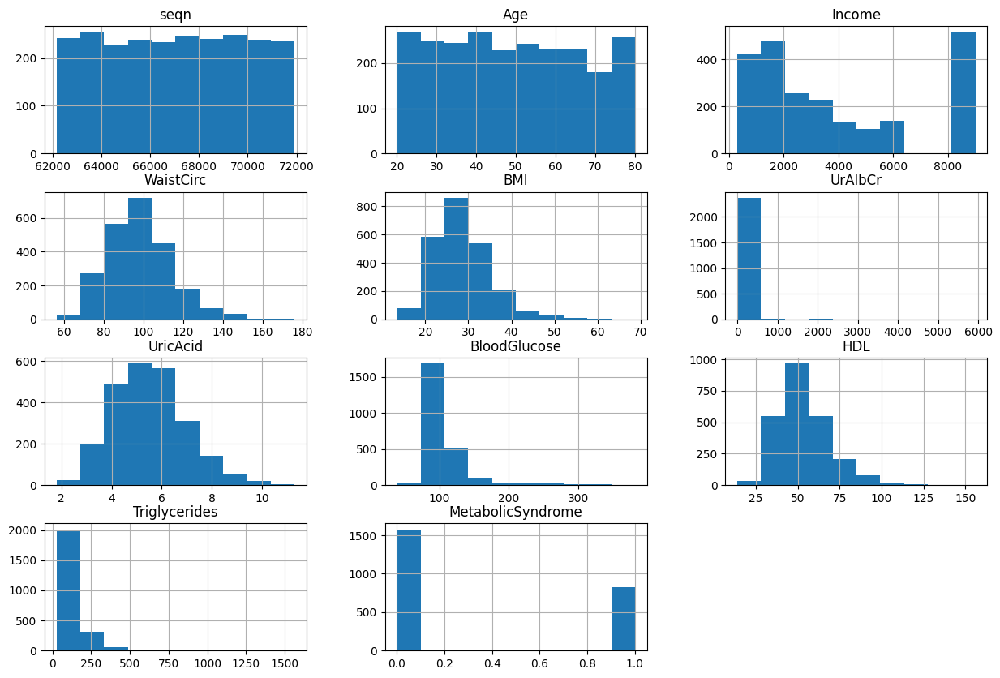

In [ ]:
#Histograma
metabolic_syndrome.hist(figsize = (15,10))
plt.show()

Podemos observar que os gráficos WaistCirc (medição da circunferência da cintura), BMI (índice de Massa Corporal - IMC), UricAcid (níveis de ácido úrico no sangue), e HDL (níveis de colesterol de lipoproteína de alta densidade - o colesterol “bom”) seguem uma distribuição aproximadamene normal.


##3.2 Gráfico de Densidade

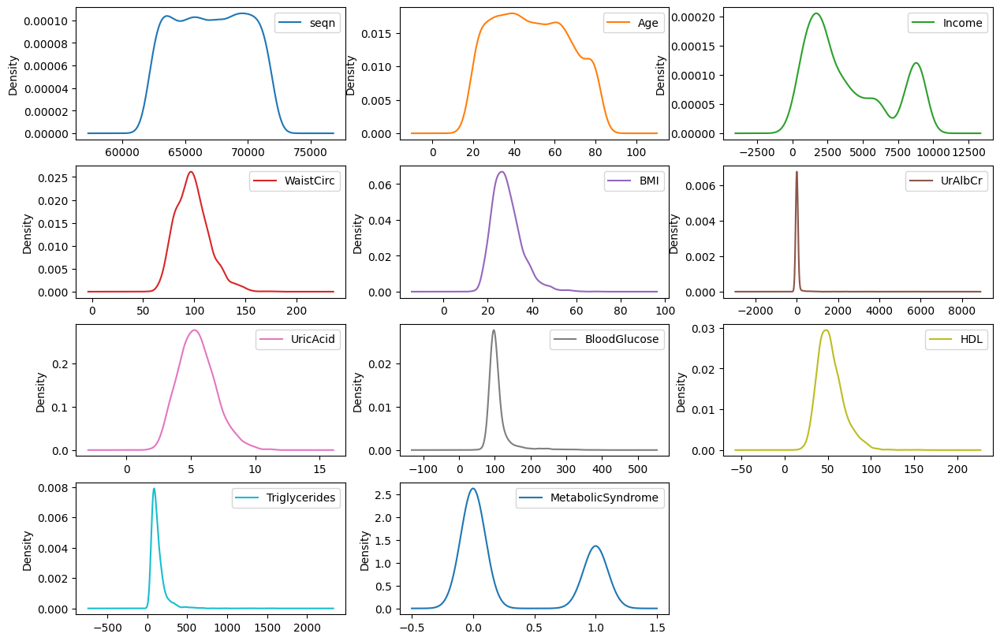

In [ ]:
# Density Plot
metabolic_syndrome.plot(kind = 'density', subplots = True, layout = (4,3), sharex = False, figsize = (15,10))
plt.show()

O density plot permite uma visão mais "limpa" dos gráficos, facilitando a classificação.

##3.3 Box Plot


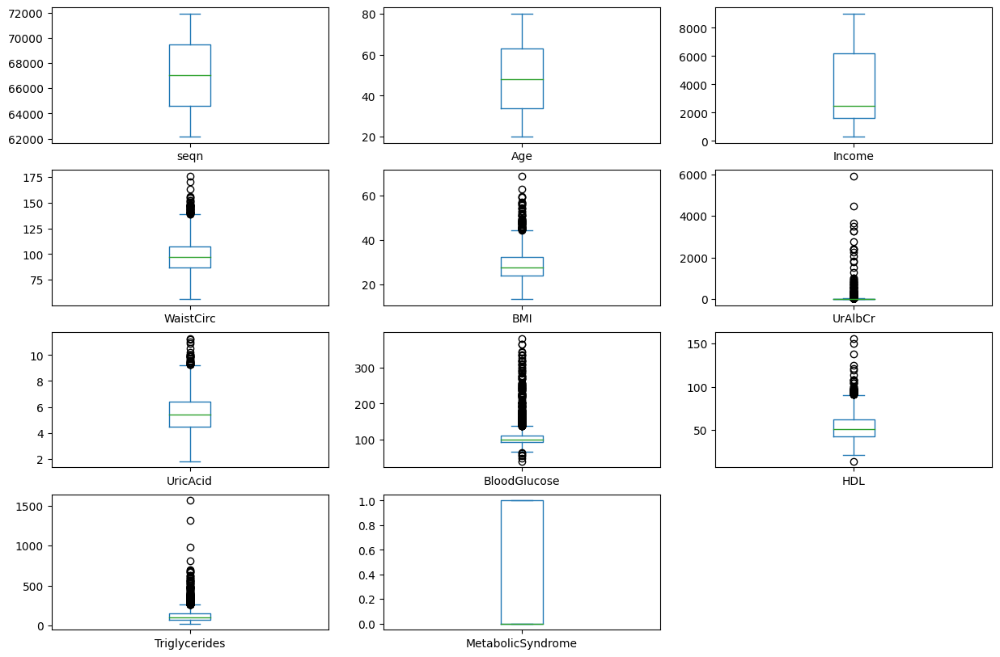

In [ ]:
# Box Plot
metabolic_syndrome.plot(kind = 'box', subplots = True, layout = (4,3), sharex = False, sharey = False, figsize = (15,10))
plt.show()

Podemos observar que a dispersão dos atributos do dataframe é bem diferente.
As bolinhas além do gráfico do ploxpot são consideradas outliers. Podemos ver que algumas váriaveis apresentam outliers enquanto que outras não.

#4. Visualizações Multimodais

##4.1 Matriz de Correlação

Para utilizar observar a matriz de correlação com Seaborn, é necessário retirar as colunas não númericas, utilizaremos entao a variável metabolic_syndrome_numeric nesse estudo.

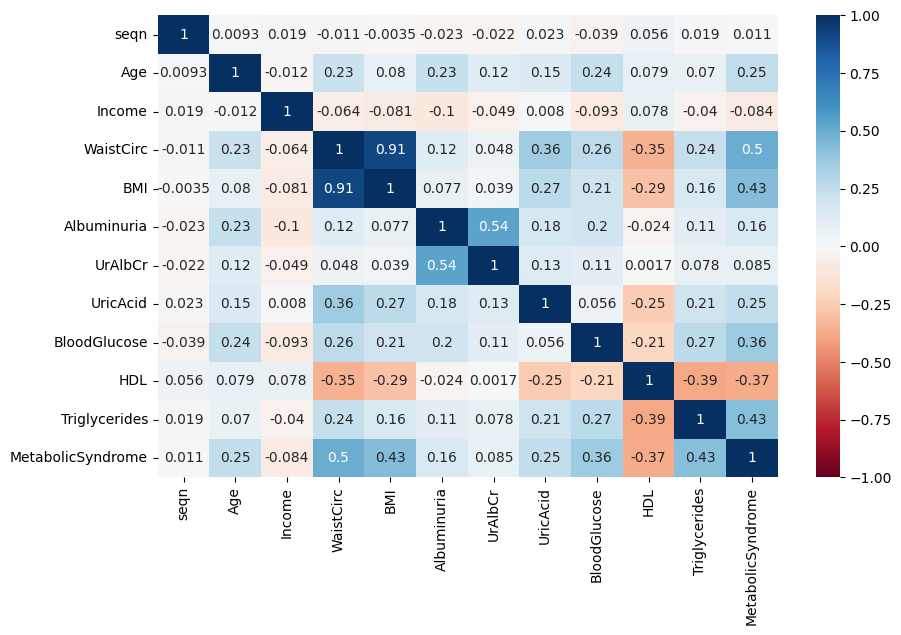

In [ ]:
# Matriz de Correlação com Seaborn
plt.figure(figsize = (10,6))
sns.heatmap(metabolic_syndrome_numeric.corr(), annot=True, cmap='RdBu', vmin=-1, vmax=1);

Podemos observar a correlação entre as variáveis, sendo a mais correlativa positivamente a WaistCirc (medição da circunferência da cintura) com a BMI (índice de Massa Corporal - IMC), e a mais correlativa negativamente sendo a HDL (níveis de colesterol de lipoproteína de alta densidade - o colesterol “bom”) e a Triglycerides (níveis de triglicerídeos no sangue).

##4.2 Scatter Plot

###4.2.1 Primeira Variação

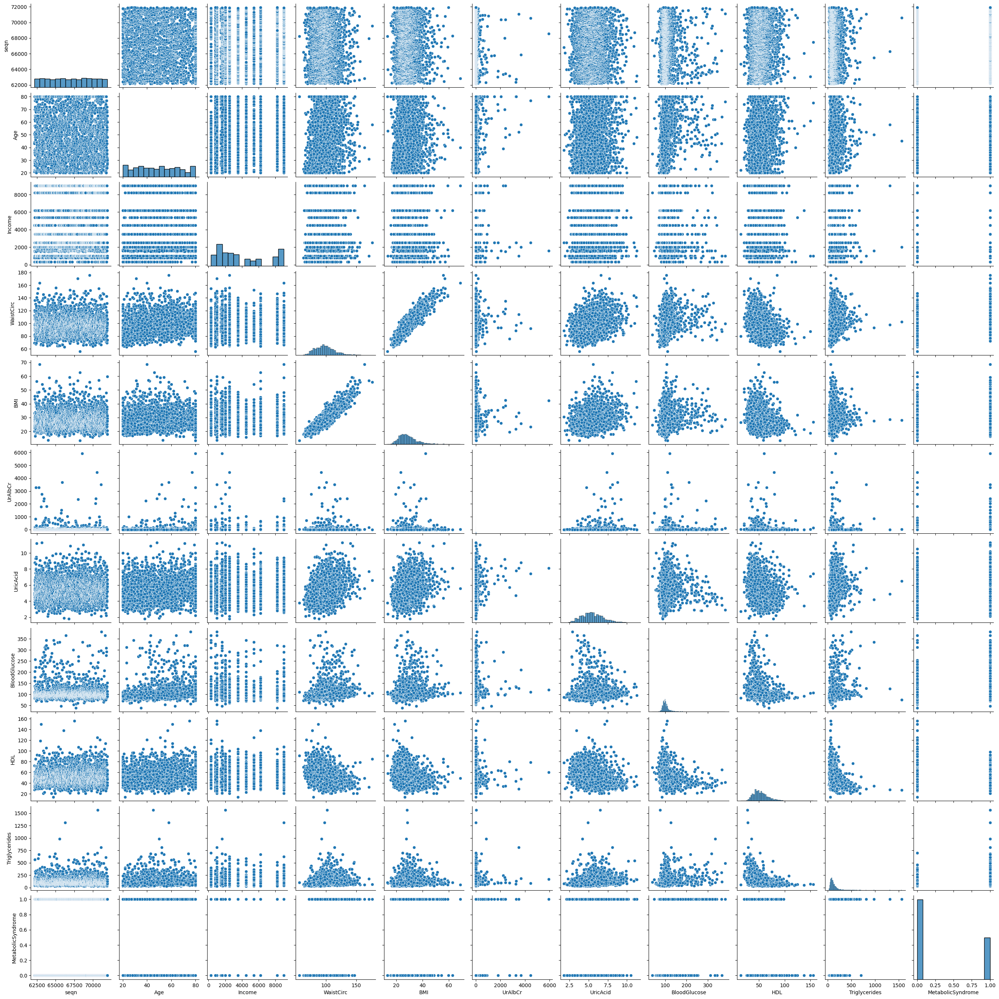

In [ ]:
#Scatter Plot com Seabor - Variação 1
sns.pairplot(metabolic_syndrome)

O Scatter Plot mostra na diagonal principal o histograma de cada atributo e no restante density plot de cada atributo separado por classe.

###4.2.2 Segunda Variação

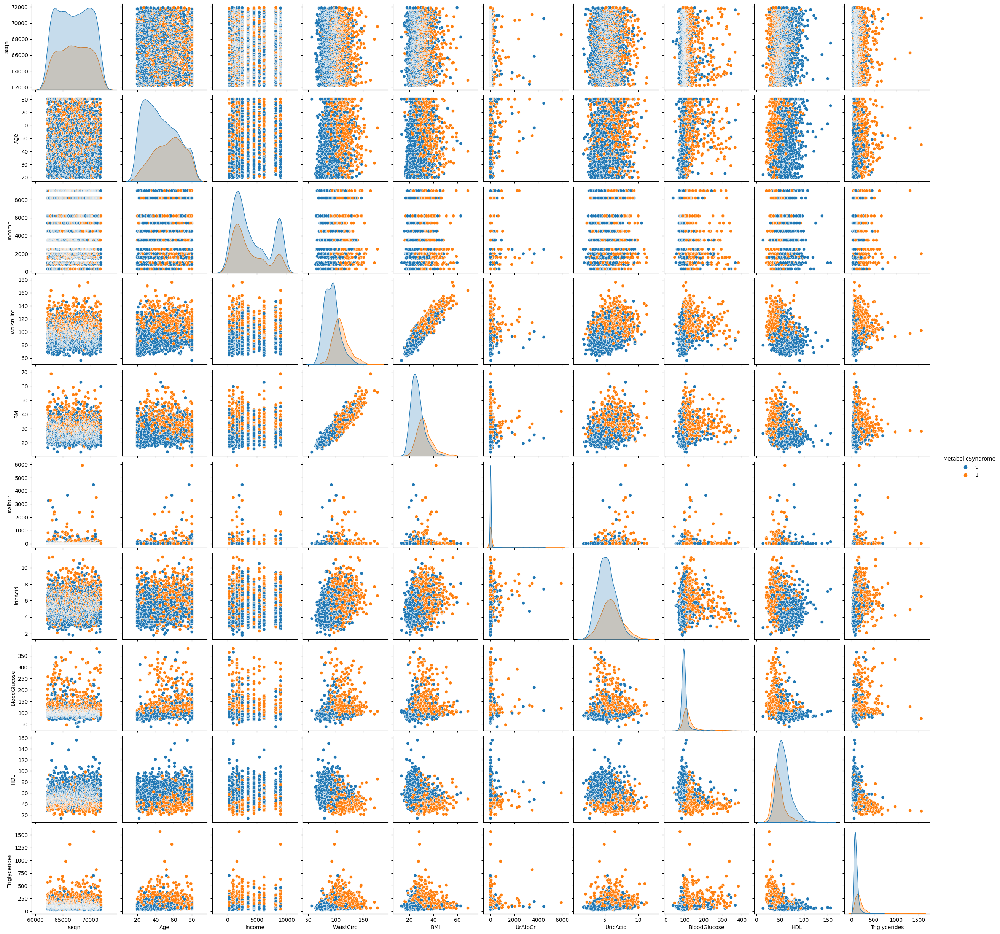

In [54]:
#Scatter Plot com Seabor - Variação 2
sns.pairplot(metabolic_syndrome, hue = 'MetabolicSyndrome', height = 2.5)

Realizamos agora o mesmo código mas fazendo a variação pela classe, ou seja, pela variável MetabolicSyndrome (nossa classe de saída)

#5. Pandas Profiling

##5.1 Geração do Relatório

In [63]:
# Instalando o 'pandas' profiling
!pip install ydata-profiling

In [64]:
# Imports necessários
import pandas as pd
from ydata_profiling import ProfileReport

In [65]:
# Geração do Report
profile = ProfileReport(metabolic_syndrome, title="Profiling Report", html={'syle':{'fill_width':False}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

O Profiling nos permite ter uma visão completa de todo o dataframe.

#6. Transformações Numéricas no Dataframe

##6.1 Tratamento de Missings

In [66]:
# Verifica nulls do dataframe
metabolic_syndrome.isnull().sum()

seqn                   0
Age                    0
Sex                    0
Marital              208
Income               117
Race                   0
WaistCirc             85
BMI                   26
Albuminuria            0
UrAlbCr                0
UricAcid               0
BloodGlucose           0
HDL                    0
Triglycerides          0
MetabolicSyndrome      0
dtype: int64

Podemos observar a quantidade de dados faltantes em cada categoria, apenas uma observação, a resposta bate com os valores que haviamos obtido no Report gerado no passo 5.1, não poderia ser diferente, pois estamos analisando o mesmo dataframe.

<Axes: >

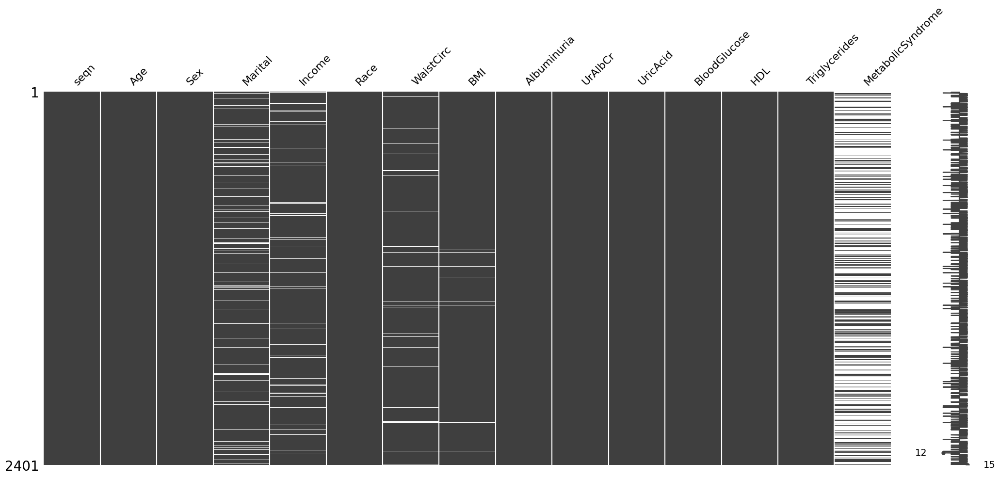

In [67]:
# Vamos salvar o dataframe original e realizar a retirada de colunas com muitos missings ou que nao são tão importantes para o estudo do dataframe

# Recuperando os nomes das colunas
col = list(metabolic_syndrome.columns)

# Novo dataframe que contém as colunas do original
metabolic_syndrome_semNulls = metabolic_syndrome[col[:]]

# substituindo os zeros por NaN
metabolic_syndrome_semNulls.replace(0, np.nan, inplace = True)

# Visualização matricial da nulidade do dataframe
ms.matrix(metabolic_syndrome_semNulls)

Podemos observar o aumento no numero de nulls no dataset, inclusive a variável Albuminuria que antes da analise nao possuia nenhum null, agora é praticamente inteira formada por nulls.

In [68]:
# Verificando novamente nulls no dataframe
metabolic_syndrome_semNulls.isnull().sum()

seqn                    0
Age                     0
Sex                     0
Marital               208
Income                117
Race                    0
WaistCirc              85
BMI                    26
Albuminuria             0
UrAlbCr                 0
UricAcid                0
BloodGlucose            0
HDL                     0
Triglycerides           0
MetabolicSyndrome    1579
dtype: int64

<Axes: >

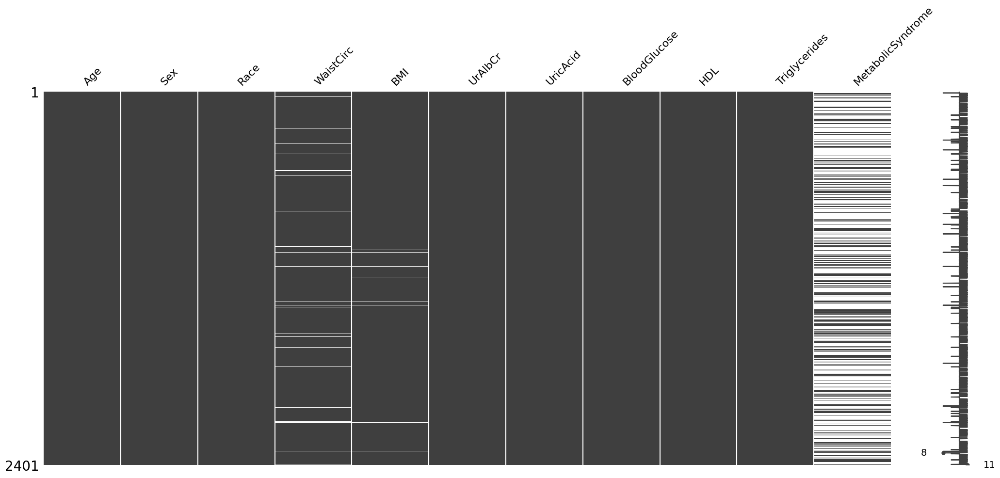

In [69]:
# Removendo as colunas com alto indice de nulls ou não importantes
metabolic_syndrome_semNulls.drop(['seqn', 'Marital', 'Income', 'Albuminuria'], axis = 1, inplace = True) #seqn trata-se apenas de um número identificador para cada indivíduo e por isso retiramos essa variável, pois não é importante para a analise do resultado, reduzindo o dimensionamento

# Exibindo a nova visualização matricial do dataframe
ms.matrix(metabolic_syndrome_semNulls)

<Axes: >

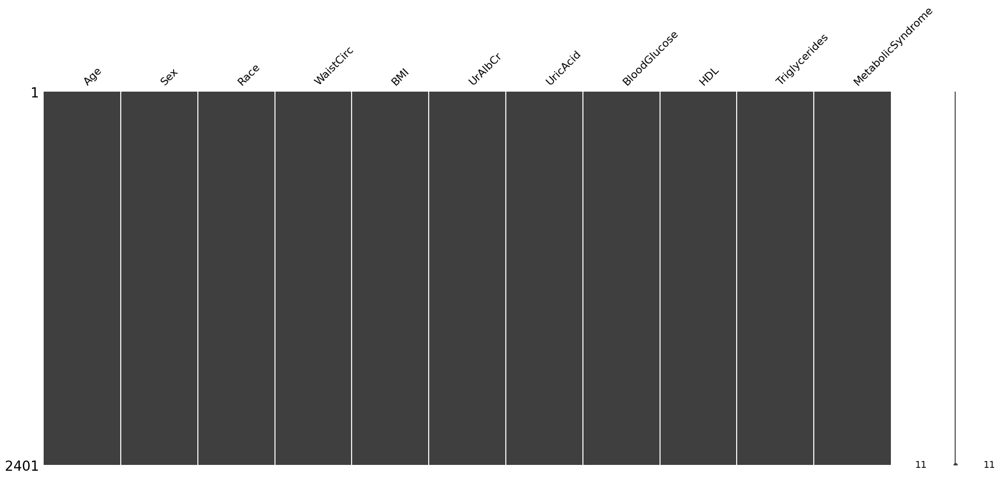

In [70]:
# Substituindo os NaN da variável de saída MetabolicSyndrome novamente por 0s, retornando ao seu valor original
metabolic_syndrome_semNulls['MetabolicSyndrome'].fillna(0, inplace = True)

# Substituindo os NaN de BMI e WaistCirc pela mediana da coluna
metabolic_syndrome_semNulls['BMI'].fillna(metabolic_syndrome_semNulls['BMI'].median(), inplace = True)
metabolic_syndrome_semNulls['WaistCirc'].fillna(metabolic_syndrome_semNulls['WaistCirc'].median(), inplace = True)

# Exibindovisualização matricial do dataframe que passou pelo tratamento de missings
ms.matrix(metabolic_syndrome_semNulls)

Vemos que agora o datadrame foi tratado e não apresenta valores faltantes.

In [71]:
# Primeiras linhas do dataframe resultante
metabolic_syndrome_semNulls.head(10)

,Age,Sex,Race,WaistCirc,BMI,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,22,Male,White,81.0,23.3,3.88,4.9,92,41,84,0.0
1,44,Female,White,80.1,23.2,8.55,4.5,82,28,56,0.0
2,21,Male,Asian,69.6,20.1,5.07,5.4,107,43,78,0.0
3,43,Female,Black,120.4,33.3,5.22,5.0,104,73,141,0.0
4,51,Male,Asian,81.1,20.1,8.13,5.0,95,43,126,0.0
5,80,Male,White,112.5,28.5,9.79,4.8,105,47,100,0.0
6,26,Male,Black,78.6,22.1,9.21,5.4,87,61,40,0.0
7,30,Female,Asian,80.2,22.4,8.78,6.7,83,48,91,0.0
8,70,Male,Black,97.0,27.7,45.67,5.4,96,35,75,0.0
9,35,Male,Black,99.0,28.2,2.21,6.7,94,46,86,0.0


In [72]:
# Verificando os nulls do dataframe resultante
metabolic_syndrome_semNulls.isnull().sum()

Age                  0
Sex                  0
Race                 0
WaistCirc            0
BMI                  0
UrAlbCr              0
UricAcid             0
BloodGlucose         0
HDL                  0
Triglycerides        0
MetabolicSyndrome    0
dtype: int64

Essa etapa foi importante pois nos permitiu identificar muitos mais valores nulos do que aparentemente tinham no dataframe

##6.2 Transformações Categóricas

###6.2.1 One-hot encoding


Como nosso dataframe possui algumas variáveis nomianis, vamos transforma-las em numéricas, desse modo poderemos refazer os estudos de correlação em que tiramos as colunas nominais.
Essa transformação será útil mais para frente, quando utilizarmos algoritmos de machine learning.

In [ ]:
# Vamos saparar as variaveis que queremos transfomar em númericas, o primeiro passo é sempre criar um datafame novo, preservando o original

# Recupera os nomes das colunas
col = list(metabolic_syndrome.columns)

# Novo dataframe que contém as colunas do original
metabolic_syndrome_nominal = metabolic_syndrome[col[:]]

# Separa as colunas que queremos alterar
colunas_desejadas = ['Sex', 'Marital', 'Race']

# Mantem apenas as colunas que iremos transformar
metabolic_syndrome_nominal = metabolic_syndrome_nominal.filter(items=colunas_desejadas)

In [77]:
# Utiliza o encode no novo dataframe
encoded = OneHotEncoder(sparse = False).fit_transform(metabolic_syndrome_nominal)

# Verifica os dados transformados
print('Atributos transformados: ')
print(encoded)

Atributos transformados: 
[[0. 1. 0. ... 0. 0. 1.]
 [1. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 0. 0. 1.]]


In [81]:
# Vendo a Correlação de 'encoded', as variaveis que antes eram nominais e agora
correlation_matrix = np.corrcoef(encoded, rowvar=False)

# O parâmetro rowvar=False significa que as colunas representam as variáveis e as linhas as observações
print(correlation_matrix)

[[ 1.         -1.          0.0053727  -0.08865672  0.04309348  0.01401633
   0.14209584 -0.02638486 -0.01424268  0.05478766  0.00370779 -0.03148961
   0.00123472 -0.01979055]
 [-1.          1.         -0.0053727   0.08865672 -0.04309348 -0.01401633
  -0.14209584  0.02638486  0.01424268 -0.05478766 -0.00370779  0.03148961
  -0.00123472  0.01979055]
 [ 0.0053727  -0.0053727   1.         -0.33243469 -0.06795376 -0.17126816
  -0.09124239 -0.10310832 -0.08311977  0.01900776  0.01385696 -0.02928923
  -0.02767945  0.06233327]
 [-0.08865672  0.08865672 -0.33243469  1.         -0.20153809 -0.50794917
  -0.27060777 -0.30579989  0.11754556 -0.17477989 -0.01506215 -0.0206312
  -0.02797273  0.0970752 ]
 [ 0.04309348 -0.04309348 -0.06795376 -0.20153809  1.         -0.10383109
  -0.05531558 -0.06250928 -0.06552062  0.06779398  0.08176265  0.0764724
  -0.01919321 -0.10482938]
 [ 0.01401633 -0.01401633 -0.17126816 -0.50794917 -0.10383109  1.
  -0.13941534 -0.15754609  0.03967343  0.15257329 -0.04753087

##6.3 Normalização e Padronização

Para trabalhar com padronização e Normalização utilizaremos o dataframe que contem apenas informações numéricas. Essa etapa é importante para que os algoritmos conseguem fazer suas análises de forma correta sem dar prioridade a uma informação que pode não ser prioritária

In [86]:
# Separando os valores do dataframe em componentes de input (x) e output (y)
X = metabolic_syndrome_numeric.values[:,0:11]
Y = metabolic_syndrome_numeric.values[:,11]

In [89]:
# Normalizando os dados
rescaledX = MinMaxScaler().fit_transform(X)

# Exibindo os dados transformados
print('Dados Originais : \n\n', metabolic_syndrome_numeric.values)
print('\nDados Normalizados : \n\n', rescaledX)

Dados Originais : 

 [[62161 22 8200.0 ... 41 84 0]
 [62164 44 4500.0 ... 28 56 0]
 [62169 21 800.0 ... 43 78 0]
 ...
 [71909 28 800.0 ... 47 84 0]
 [71911 27 8200.0 ... 41 124 1]
 [71915 60 6200.0 ... 36 226 1]]

Dados Normalizados : 

 [[0.00000000e+00 3.33333333e-02 9.08045977e-01 ... 1.54518950e-01
  1.90140845e-01 3.77604167e-02]
 [3.07566127e-04 4.00000000e-01 4.82758621e-01 ... 1.25364431e-01
  9.85915493e-02 1.95312500e-02]
 [8.20176338e-04 1.66666667e-02 5.74712644e-02 ... 1.98250729e-01
  2.04225352e-01 3.38541667e-02]
 ...
 [9.99384868e-01 1.33333333e-01 5.74712644e-02 ... 1.74927114e-01
  2.32394366e-01 3.77604167e-02]
 [9.99589912e-01 1.16666667e-01 9.08045977e-01 ... 1.77842566e-01
  1.90140845e-01 6.38020833e-02]
 [1.00000000e+00 6.66666667e-01 6.78160920e-01 ... 1.51603499e-01
  1.54929577e-01 1.30208333e-01]]


In [90]:
# Padronizando os dados
rescaledX = StandardScaler().fit_transform(X)

# Exibindo os dados transformados
print('Dados Originais : \n\n', metabolic_syndrome_numeric.values)
print('\nDados Normalizados : \n\n', rescaledX)


Dados Originais : 

 [[62161 22 8200.0 ... 41 84 0]
 [62164 44 4500.0 ... 28 56 0]
 [62169 21 800.0 ... 43 78 0]
 ...
 [71909 28 800.0 ... 47 84 0]
 [71911 27 8200.0 ... 41 124 1]
 [71915 60 6200.0 ... 36 226 1]]

Dados Normalizados : 

 [[-1.72501377 -1.51406904  1.42031785 ... -0.46671141 -0.81472296
  -0.46300261]
 [-1.72395107 -0.26613803  0.16751828 ... -0.75395709 -1.670979
  -0.75680355]
 [-1.72217989 -1.57079318 -1.08528128 ... -0.0358429  -0.68299127
  -0.52595996]
 ...
 [ 1.72807841 -1.17372422 -1.08528128 ... -0.26563944 -0.41952787
  -0.46300261]
 [ 1.72878688 -1.23044835  1.42031785 ... -0.23691487 -0.81472296
  -0.043287  ]
 [ 1.73020382  0.64144816  0.7431289  ... -0.49543598 -1.14405221
   1.02698783]]
